<a href="https://colab.research.google.com/github/rajni-arora/Deep-Learning-Projects/blob/main/Image_Classification_DenseNet121(Monkey%20Breed).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Freeze all layers except the top 4, as we'll only be training the top 4

from tensorflow.keras.applications.densenet import DenseNet121

# ResNet was designed to work on 224 x 224 pixel input images sizes
img_rows, img_cols = 224, 224 

# Re-loads the ResNet model without the top or FC layers
DenseNet121  = DenseNet121(weights = 'imagenet', 
                 include_top = False, 
                 input_shape = (img_rows, img_cols, 3))

# Here we freeze the last 4 layers 
# Layers are set to trainable as True by default
for layer in DenseNet121 .layers:
    layer.trainable = False
    
# Let's print our layers 
for (i,layer) in enumerate(DenseNet121 .layers):
    print(str(i) + " "+ layer.__class__.__name__, layer.trainable)

29097984/29084464 [==============================] - 0s 0us/step
0 InputLayer False
1 ZeroPadding2D False
2 Conv2D False
3 BatchNormalization False
4 Activation False
5 ZeroPadding2D False
6 MaxPooling2D False
7 BatchNormalization False
8 Activation False
9 Conv2D False
10 BatchNormalization False
11 Activation False
12 Conv2D False
13 Concatenate False
14 BatchNormalization False
15 Activation False
16 Conv2D False
17 BatchNormalization False
18 Activation False
19 Conv2D False
20 Concatenate False
21 BatchNormalization False
22 Activation False
23 Conv2D False
24 BatchNormalization False
25 Activation False
26 Conv2D False
27 Concatenate False
28 BatchNormalization False
29 Activation False
30 Conv2D False
31 BatchNormalization False
32 Activation False
33 Conv2D False
34 Concatenate False
35 BatchNormalization False
36 Activation False
37 Conv2D False
38 BatchNormalization False
39 Activation False
40 Conv2D False
41 Concatenate False
42 BatchNormalization False
43 Activation False


In [ ]:
def addTopModelDenseNet121(bottom_model, num_classes):
    """creates the top or head of the model that will be 
    placed ontop of the bottom layers"""

    top_model = bottom_model.output
    top_model = GlobalAveragePooling2D()(top_model)
    top_model = Dense(512,activation='relu')(top_model)
    top_model = Dense(512,activation='relu')(top_model)
    top_model = Dense(256,activation='relu')(top_model)
    top_model = Dense(num_classes,activation='softmax')(top_model)
    return top_model

In [ ]:
from tensorflow.python.keras.layers import Dense, Dropout, Activation, Flatten, GlobalAveragePooling2D
from tensorflow.python.keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.python.keras.models import Model

In [ ]:
from keras.layers import Dense, Dropout, Activation, Flatten, GlobalAveragePooling2D
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from keras.models import Model

# Set our class number to 3 (Young, Middle, Old)
num_classes = 10

FC_Head = addTopModelDenseNet121(DenseNet121, num_classes)

model = Model(inputs = DenseNet121.input, outputs = FC_Head)

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

In [ ]:
!unzip /content/drive/MyDrive/monkey_breed.zip

Archive:  /content/drive/MyDrive/monkey_breed.zip
   creating: monkey_breed/train/
   creating: monkey_breed/train/n0/
  inflating: monkey_breed/train/n0/n0018.jpg  
  inflating: monkey_breed/train/n0/n0019.jpg  
  inflating: monkey_breed/train/n0/n0020.jpg  
  inflating: monkey_breed/train/n0/n0021.jpg  
  inflating: monkey_breed/train/n0/n0022.jpg  
  inflating: monkey_breed/train/n0/n0023.jpg  
  inflating: monkey_breed/train/n0/n0024.jpg  
  inflating: monkey_breed/train/n0/n0025.jpg  
  inflating: monkey_breed/train/n0/n0026.jpg  
  inflating: monkey_breed/train/n0/n0027.jpg  
  inflating: monkey_breed/train/n0/n0028.jpg  
  inflating: monkey_breed/train/n0/n0029.jpg  
  inflating: monkey_breed/train/n0/n0030.jpg  
  inflating: monkey_breed/train/n0/n0031.jpg  
  inflating: monkey_breed/train/n0/n0032.jpg  
  inflating: monkey_breed/train/n0/n0033.jpg  
  inflating: monkey_breed/train/n0/n0034.jpg  
  inflating: monkey_breed/train/n0/n0035.jpg  
  inflating: monkey_breed/train/n0/

In [ ]:
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

train_data_dir = '/content/monkey_breed/train'
validation_data_dir = '/content/monkey_breed/validation'

# Let's use some data augmentaiton 
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=45,
      width_shift_range=0.3,
      height_shift_range=0.3,
      horizontal_flip=True
      )
 
validation_datagen = ImageDataGenerator(rescale=1./255)
 
# set our batch size (typically on most mid tier systems we'll use 16-32)
batch_size = 32
 
train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical')
 
validation_generator = validation_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical')

Found 1098 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

                     
checkpoint = ModelCheckpoint("monkey_breed_ResNet.h5",
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

earlystop = EarlyStopping(monitor = 'val_loss', 
                          min_delta = 0, 
                          patience = 3,
                          verbose = 1,
                          restore_best_weights = True)

# we put our call backs into a callback list
callbacks = [earlystop, checkpoint]


In [ ]:
# We use a very small learning rate 
model.compile(loss = 'categorical_crossentropy',
              optimizer =RMSprop(lr = 0.001),
              metrics = ['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
# Enter the number of training and validation samples here
# nb_train_samples = 1098
# nb_validation_samples = 272

# We only train 5 EPOCHS 
epochs = 100
batch_size = 16

history = model.fit_generator(
    train_generator,
    
    epochs = epochs,
    callbacks = callbacks,
    validation_data = validation_generator
    )

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
35/35 [==============================] - 90s 1s/step - loss: 1.6760 - accuracy: 0.4845 - val_loss: 0.4168 - val_accuracy: 0.8676

Epoch 00001: val_loss improved from inf to 0.41682, saving model to monkey_breed_ResNet.h5
Epoch 2/100
35/35 [==============================] - 49s 1s/step - loss: 0.6319 - accuracy: 0.7987 - val_loss: 0.1973 - val_accuracy: 0.9412

Epoch 00002: val_loss improved from 0.41682 to 0.19726, saving model to monkey_breed_ResNet.h5
Epoch 3/100
35/35 [==============================] - 49s 1s/step - loss: 0.4286 - accuracy: 0.8497 - val_loss: 0.1574 - val_accuracy: 0.9596

Epoch 00003: val_loss improved from 0.19726 to 0.15743, saving model to monkey_breed_ResNet.h5
Epoch 4/100
35/35 [==============================] - 48s 1s/step - loss: 0.3907 - accuracy: 0.8789 - val_loss: 0.1839 - val_accuracy: 0.9449

Epoch 00004: val_loss did not improve from 0.15743
Epoch 5/100
35/35 [==============================] - 48s 1s/step - loss: 0.3786 - accuracy: 0.8889 -

In [13]:
from tensorflow.keras.models import load_model

classifier = load_model('monkey_breed_ResNet.h5')

In [14]:
preds = classifier.predict_generator(validation_generator)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2035: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


In [15]:
import numpy as np
y_pred = np.argmax(preds, axis=1)
y_pred

array([5, 7, 1, 7, 2, 9, 1, 0, 2, 6, 9, 4, 3, 7, 3, 7, 6, 5, 4, 1, 1, 9,
       0, 1, 1, 0, 9, 3, 8, 5, 8, 7, 1, 8, 3, 8, 0, 3, 6, 4, 5, 6, 1, 1,
       3, 1, 4, 4, 6, 3, 1, 3, 1, 1, 9, 9, 2, 5, 7, 4, 5, 9, 4, 4, 1, 0,
       7, 2, 1, 8, 3, 9, 4, 0, 7, 9, 7, 3, 0, 8, 1, 1, 4, 8, 9, 7, 3, 7,
       6, 4, 9, 0, 9, 5, 2, 0, 3, 3, 5, 6, 0, 7, 4, 7, 2, 3, 5, 5, 8, 1,
       6, 3, 7, 3, 3, 7, 3, 3, 1, 7, 4, 5, 5, 0, 3, 7, 4, 6, 6, 0, 3, 8,
       8, 1, 3, 8, 2, 5, 7, 6, 1, 9, 5, 0, 2, 8, 2, 6, 2, 4, 3, 6, 2, 7,
       6, 3, 4, 2, 3, 3, 9, 2, 7, 9, 6, 1, 8, 3, 2, 0, 1, 6, 5, 1, 0, 7,
       8, 6, 5, 0, 8, 0, 3, 0, 6, 0, 8, 2, 0, 5, 2, 5, 0, 7, 9, 8, 0, 1,
       5, 2, 0, 0, 3, 8, 4, 5, 8, 5, 2, 2, 7, 5, 3, 3, 1, 3, 2, 0, 3, 2,
       6, 0, 4, 3, 9, 1, 7, 5, 2, 8, 0, 3, 7, 8, 7, 5, 6, 8, 9, 8, 7, 3,
       2, 4, 9, 7, 6, 1, 7, 6, 4, 3, 6, 2, 0, 0, 4, 9, 4, 4, 8, 5, 5, 6,
       2, 8, 2, 0, 9, 5, 0, 0])

In [16]:
import numpy as np
y_pred = np.argmax(preds, axis=1)
y_pred

array([5, 7, 1, 7, 2, 9, 1, 0, 2, 6, 9, 4, 3, 7, 3, 7, 6, 5, 4, 1, 1, 9,
       0, 1, 1, 0, 9, 3, 8, 5, 8, 7, 1, 8, 3, 8, 0, 3, 6, 4, 5, 6, 1, 1,
       3, 1, 4, 4, 6, 3, 1, 3, 1, 1, 9, 9, 2, 5, 7, 4, 5, 9, 4, 4, 1, 0,
       7, 2, 1, 8, 3, 9, 4, 0, 7, 9, 7, 3, 0, 8, 1, 1, 4, 8, 9, 7, 3, 7,
       6, 4, 9, 0, 9, 5, 2, 0, 3, 3, 5, 6, 0, 7, 4, 7, 2, 3, 5, 5, 8, 1,
       6, 3, 7, 3, 3, 7, 3, 3, 1, 7, 4, 5, 5, 0, 3, 7, 4, 6, 6, 0, 3, 8,
       8, 1, 3, 8, 2, 5, 7, 6, 1, 9, 5, 0, 2, 8, 2, 6, 2, 4, 3, 6, 2, 7,
       6, 3, 4, 2, 3, 3, 9, 2, 7, 9, 6, 1, 8, 3, 2, 0, 1, 6, 5, 1, 0, 7,
       8, 6, 5, 0, 8, 0, 3, 0, 6, 0, 8, 2, 0, 5, 2, 5, 0, 7, 9, 8, 0, 1,
       5, 2, 0, 0, 3, 8, 4, 5, 8, 5, 2, 2, 7, 5, 3, 3, 1, 3, 2, 0, 3, 2,
       6, 0, 4, 3, 9, 1, 7, 5, 2, 8, 0, 3, 7, 8, 7, 5, 6, 8, 9, 8, 7, 3,
       2, 4, 9, 7, 6, 1, 7, 6, 4, 3, 6, 2, 0, 0, 4, 9, 4, 4, 8, 5, 5, 6,
       2, 8, 2, 0, 9, 5, 0, 0])

In [17]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import classification_report

In [18]:
class_labels = validation_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}
classes = list(class_labels.values())

In [19]:
target_names = list(class_labels.values())

Confusion Matrix
[[3 6 2 2 2 2 2 4 0 3]
 [1 7 0 6 3 2 3 1 4 1]
 [3 3 2 2 4 2 0 4 2 5]
 [3 2 2 4 3 4 3 4 2 3]
 [2 2 1 8 2 2 2 4 3 0]
 [1 1 6 4 2 2 5 3 1 3]
 [7 3 3 2 0 3 3 1 4 0]
 [5 2 4 5 1 5 0 2 3 1]
 [2 1 3 3 2 2 2 5 4 3]
 [5 1 3 1 4 3 4 1 2 2]]
Classification Report
              precision    recall  f1-score   support

          n0       0.09      0.12      0.10        26
          n1       0.25      0.25      0.25        28
          n2       0.08      0.07      0.08        27
          n3       0.11      0.13      0.12        30
          n4       0.09      0.08      0.08        26
          n5       0.07      0.07      0.07        28
          n6       0.12      0.12      0.12        26
          n7       0.07      0.07      0.07        28
          n8       0.16      0.15      0.15        27
          n9       0.10      0.08      0.09        26

    accuracy                           0.11       272
   macro avg       0.11      0.11      0.11       272
weighted avg       0.11   

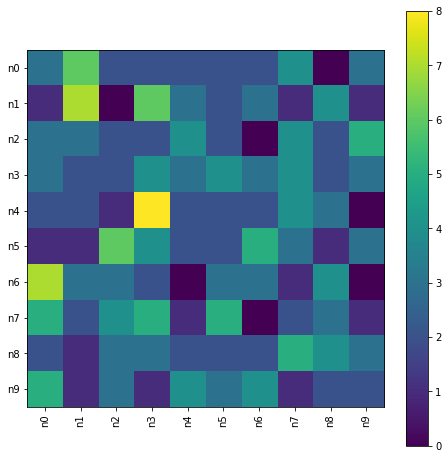

In [20]:
import matplotlib.pyplot as plt
print('Confusion Matrix')
print(confusion_matrix(validation_generator.classes, y_pred))
print('Classification Report')
target_names = list(class_labels.values())
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

plt.figure(figsize=(8,8))
cnf_matrix = confusion_matrix(validation_generator.classes, y_pred)

plt.imshow(cnf_matrix, interpolation='nearest')
plt.colorbar()
tick_marks = np.arange(len(classes))
_ = plt.xticks(tick_marks, classes, rotation=90)
_ = plt.yticks(tick_marks, classes)

Class - pygmy_marmoset 


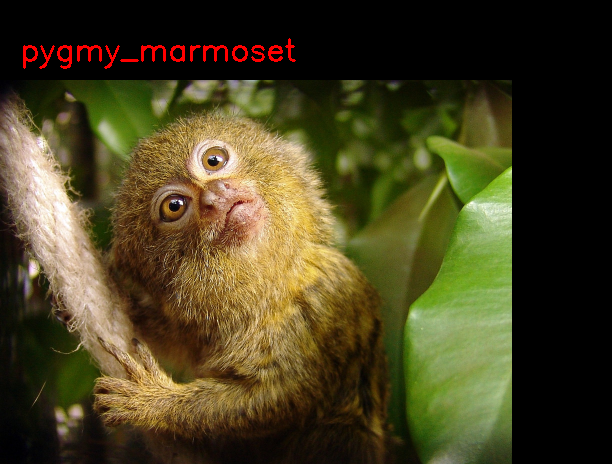

Class - silvery_marmoset


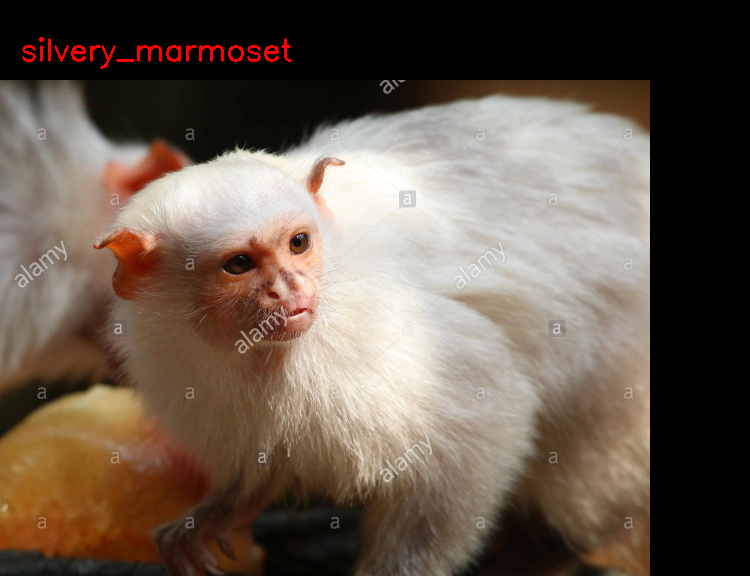

Class - nilgiri_langur


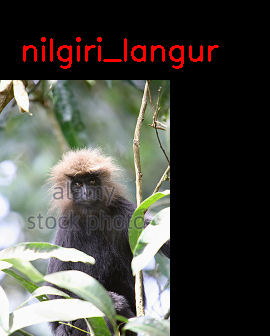

Class - japanese_macaque


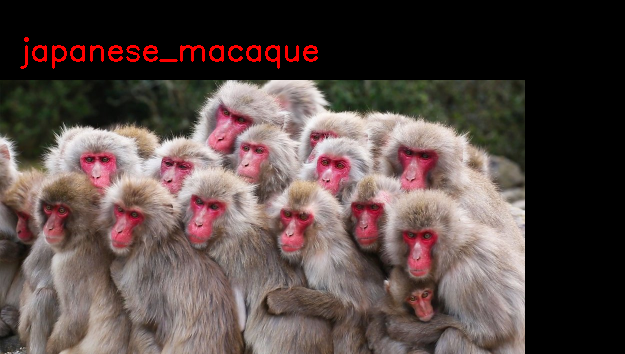

Class - japanese_macaque


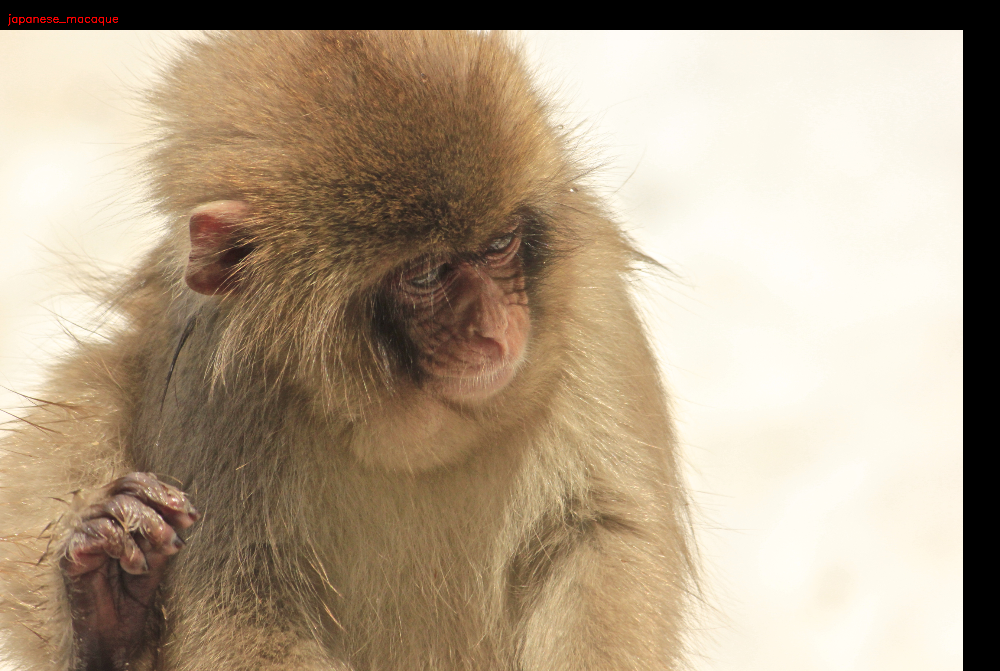

Class - patas_monkey


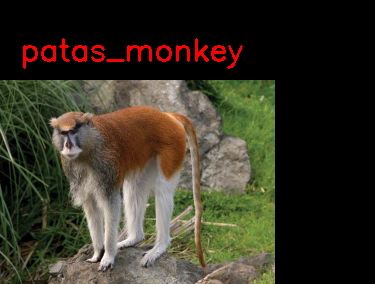

Class - patas_monkey


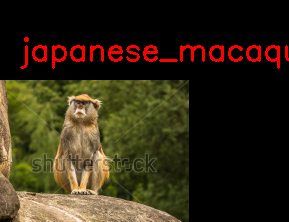

Class - mantled_howler 


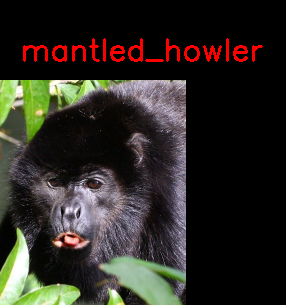

Class - white_headed_capuchin


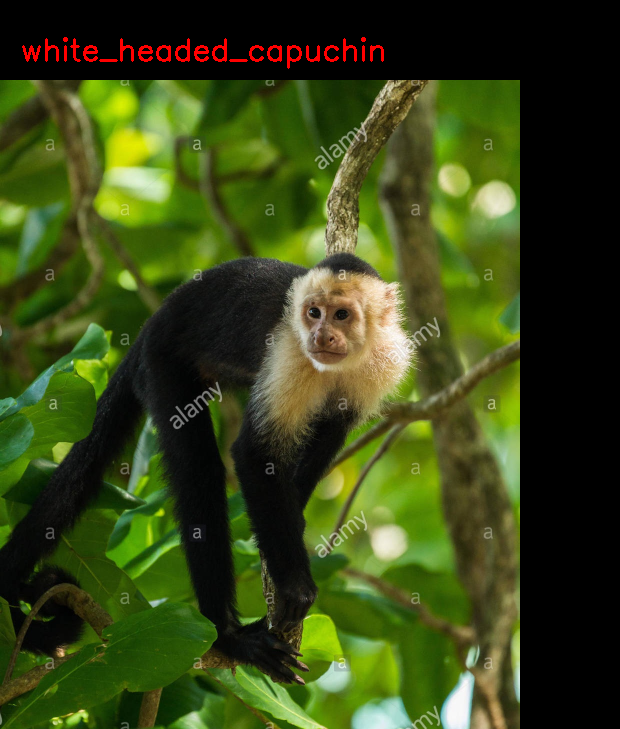

Class - white_headed_capuchin


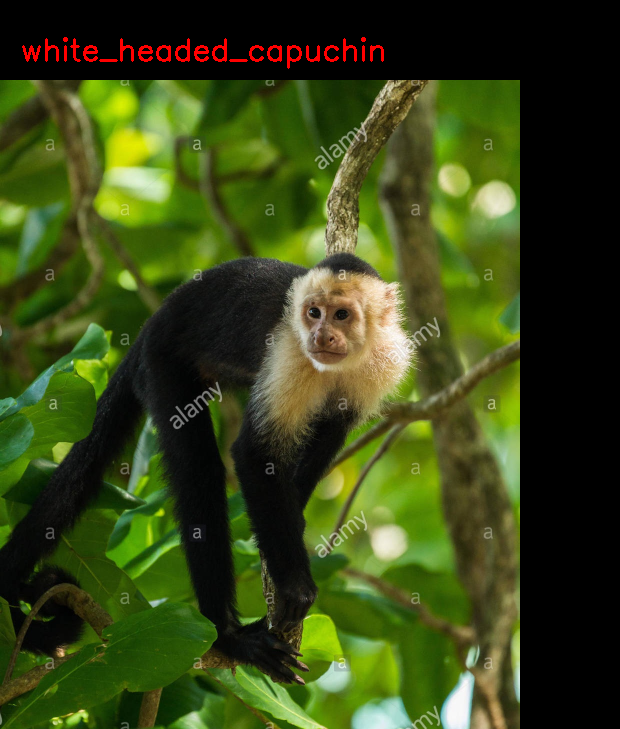

Class - pygmy_marmoset 


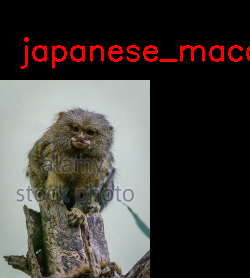

Class - black_headed_night_monkey


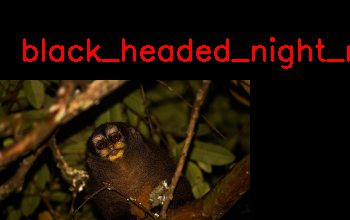

Class - common_squirrel_monkey


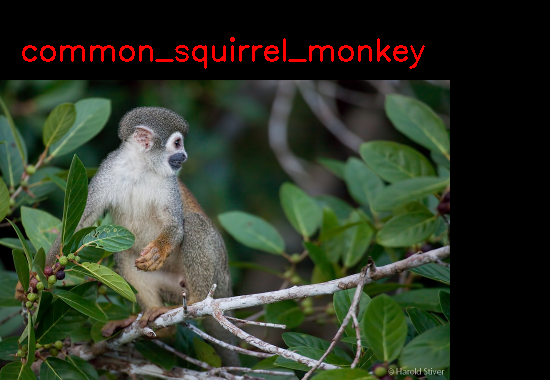

Class - nilgiri_langur


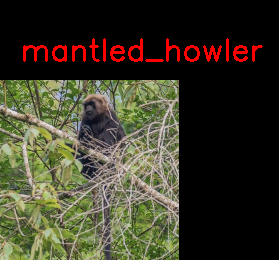

Class - patas_monkey


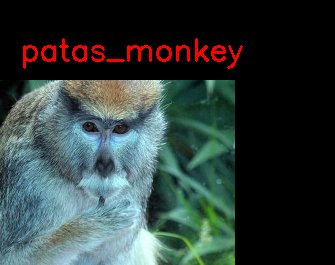

Class - black_headed_night_monkey


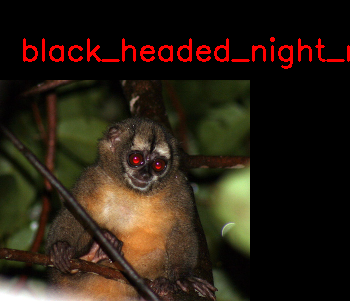

Class - bald_uakari


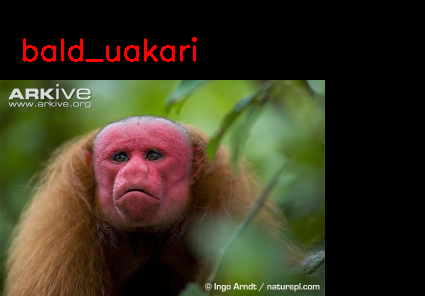

Class - black_headed_night_monkey


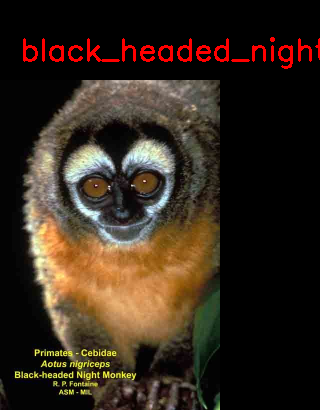

Class - mantled_howler 


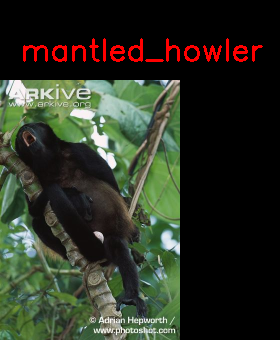

Class - black_headed_night_monkey


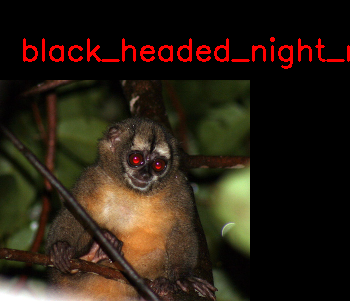

In [24]:
import os
import cv2
import numpy as np
from os import listdir
from os.path import isfile, join
from google.colab.patches import cv2_imshow

monkey_breeds_dict = {"[0]": "mantled_howler ", 
                      "[1]": "patas_monkey",
                      "[2]": "bald_uakari",
                      "[3]": "japanese_macaque",
                      "[4]": "pygmy_marmoset ",
                      "[5]": "white_headed_capuchin",
                      "[6]": "silvery_marmoset",
                      "[7]": "common_squirrel_monkey",
                      "[8]": "black_headed_night_monkey",
                      "[9]": "nilgiri_langur"}

monkey_breeds_dict_n = {"n0": "mantled_howler ", 
                      "n1": "patas_monkey",
                      "n2": "bald_uakari",
                      "n3": "japanese_macaque",
                      "n4": "pygmy_marmoset ",
                      "n5": "white_headed_capuchin",
                      "n6": "silvery_marmoset",
                      "n7": "common_squirrel_monkey",
                      "n8": "black_headed_night_monkey",
                      "n9": "nilgiri_langur"}

def draw_test(name, pred, im):
    monkey = monkey_breeds_dict[str(pred)]
    BLACK = [0,0,0]
    expanded_image = cv2.copyMakeBorder(im, 80, 0, 0, 100 ,cv2.BORDER_CONSTANT,value=BLACK)
    cv2.putText(expanded_image, monkey, (20, 60) , cv2.FONT_HERSHEY_SIMPLEX,1, (0,0,255), 2)
    cv2_imshow(expanded_image)

def getRandomImage(path):
    """function loads a random images from a random folder in our test path """
    folders = list(filter(lambda x: os.path.isdir(os.path.join(path, x)), os.listdir(path)))
    random_directory = np.random.randint(0,len(folders))
    path_class = folders[random_directory]
    print("Class - " + monkey_breeds_dict_n[str(path_class)])
    file_path = path + path_class
    file_names = [f for f in listdir(file_path) if isfile(join(file_path, f))]
    random_file_index = np.random.randint(0,len(file_names))
    image_name = file_names[random_file_index]
    return cv2.imread(file_path+"/"+image_name)    

for i in range(0,20):
    input_im = getRandomImage("./monkey_breed/validation/")
    input_original = input_im.copy()
    input_original = cv2.resize(input_original, None, fx=0.5, fy=0.5, interpolation = cv2.INTER_LINEAR)
    
    input_im = cv2.resize(input_im, (224, 224), interpolation = cv2.INTER_LINEAR)
    input_im = input_im / 255.
    input_im = input_im.reshape(1,224,224,3) 
    
    # Get Prediction
    res = np.argmax(classifier.predict(input_im, 1, verbose = 0), axis=1)
    
    # Show image with predicted class
    draw_test("Prediction", res, input_original) 